In [ ]:
'''
AMAR (my dear friend) + ARMY = AMARMY!!! Joint hackathon project

Ghost gan model does not support multiple faces. Only one target. Super scuffed Solution:

1. Use face detector
2. Crop all faces from target image (image with the faces you want the source image's face to replace)
3. Run Ghost model on each cropped face
4. Slap the outputs onto where each face was originally cropped

Using
https://github.com/ageitgey/face_recognition
https://github.com/ai-forever/ghost

'''

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Installations

In [ ]:
!pip3 install face_recognition

from PIL import Image
import face_recognition
import numpy as np

!git clone https://github.com/sberbank-ai/sber-swap.git
%cd sber-swap

# load arcface
!wget -P ./arcface_model https://github.com/sberbank-ai/sber-swap/releases/download/arcface/backbone.pth
!wget -P ./arcface_model https://github.com/sberbank-ai/sber-swap/releases/download/arcface/iresnet.py

# load landmarks detector
!wget -P ./insightface_func/models/antelope https://github.com/sberbank-ai/sber-swap/releases/download/antelope/glintr100.onnx
!wget -P ./insightface_func/models/antelope https://github.com/sberbank-ai/sber-swap/releases/download/antelope/scrfd_10g_bnkps.onnx

# load model itself
!wget -P ./weights https://github.com/sberbank-ai/sber-swap/releases/download/sber-swap-v2.0/G_unet_2blocks.pth

# load super res model
!wget -P ./weights https://github.com/sberbank-ai/sber-swap/releases/download/super-res/10_net_G.pth

!pip install mxnet-cu112
!pip install onnxruntime-gpu==1.8
!pip install insightface==0.2.1
!pip install kornia==0.5.4
!pip install dill


from numpy.core.multiarray import min_scalar_type
import sys
import argparse
import cv2
import torch
import time
import os

from utils.inference.image_processing import crop_face, get_final_image, show_images
from utils.inference.video_processing import read_video, get_target, get_final_video, add_audio_from_another_video, face_enhancement
from utils.inference.core import model_inference

from network.AEI_Net import AEI_Net
from coordinate_reg.image_infer import Handler
from insightface_func.face_detect_crop_multi import Face_detect_crop
from arcface_model.iresnet import iresnet100
from models.pix2pix_model import Pix2PixModel
from models.config_sr import TestOptions
import warnings
warnings.filterwarnings("ignore")

app = Face_detect_crop(name='antelope', root='./insightface_func/models')
app.prepare(ctx_id= 0, det_thresh=0.6, det_size=(640,640))

# main model for generation
G = AEI_Net(backbone='unet', num_blocks=2, c_id=512)
G.eval()
G.load_state_dict(torch.load('weights/G_unet_2blocks.pth', map_location=torch.device('cpu')))
G = G.cuda()
G = G.half()

# arcface model to get face embedding
netArc = iresnet100(fp16=False)
netArc.load_state_dict(torch.load('arcface_model/backbone.pth'))
netArc=netArc.cuda()
netArc.eval()

# model to get face landmarks
handler = Handler('./coordinate_reg/model/2d106det', 0, ctx_id=0, det_size=640)

# model to make superres of face, set use_sr=True if you want to use super resolution or use_sr=False if you don't
use_sr = True
if use_sr:
    os.environ['CUDA_VISIBLE_DEVICES'] = '0'
    torch.backends.cudnn.benchmark = True
    opt = TestOptions()
    #opt.which_epoch ='10_7'
    model = Pix2PixModel(opt)
    model.netG.train()

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Cloning into 'sber-swap'...
remote: Enumerating objects: 704, done.
remote: Total 704 (delta 0), reused 0 (delta 0), pack-reused 704
Receiving objects: 100% (704/704), 93.99 MiB | 43.67 MiB/s, done.
Resolving deltas: 100% (176/176), done.
/content/sber-swap/sber-swap
--2023-03-25 19:27:53--  https://github.com/sberbank-ai/sber-swap/releases/download/arcface/backbone.pth
Resolving github.com (github.com)... 140.82.114.3
Connecting to github.com (github.com)|140.82.114.3|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://github.com/ai-forever/ghost/releases/download/arcface/backbone.pth [following]
--2023-03-25 19:27:53--  https://github.com/ai-forever/ghost/releases/download/arcface/backbone.pth
Reusing existing connection to github.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://objects.githubusercontent.com/gith

# Messy

In [ ]:
%cd "/content/sber-swap"

/content/sber-swap


In [ ]:
G_path='weights/G_unet_2blocks.pth'
backbone='unet'
num_blocks=2

batch_size=40
crop_size=224
use_sr=False
similarity_th=0.15
app, G, netArc, handler, model = init_models(num_blocks, backbone, G_path, use_sr)

input mean and std: 127.5 127.5
find model: ./insightface_func/models/antelope/glintr100.onnx recognition
find model: ./insightface_func/models/antelope/scrfd_10g_bnkps.onnx detection
set det-size: (640, 640)
loading ./coordinate_reg/model/2d106det 0
input mean and std: 127.5 127.5
find model: ./insightface_func/models/antelope/glintr100.onnx recognition
find model: ./insightface_func/models/antelope/scrfd_10g_bnkps.onnx detection
set det-size: (640, 640)


In [ ]:

def init_models(num_blocks, backbone, G_path, use_sr):
    # model for face cropping
    app = Face_detect_crop(name='antelope', root='./insightface_func/models')
    app.prepare(ctx_id= 0, det_thresh=0.6, det_size=(640,640))

    # main model for generation
    G = AEI_Net(backbone, num_blocks=num_blocks, c_id=512)
    G.eval()
    G.load_state_dict(torch.load(G_path, map_location=torch.device('cpu')))
    G = G.cuda()
    G = G.half()

    # arcface model to get face embedding
    netArc = iresnet100(fp16=False)
    netArc.load_state_dict(torch.load('arcface_model/backbone.pth'))
    netArc=netArc.cuda()
    netArc.eval()


    # model to get face landmarks 
    handler = Handler('./coordinate_reg/model/2d106det', 0, ctx_id=0, det_size=640)

    # model to make superres of face, set use_sr=True if you want to use super resolution or use_sr=False if you don't
    if use_sr:
        os.environ['CUDA_VISIBLE_DEVICES'] = '0'
        torch.backends.cudnn.benchmark = True
        opt = TestOptions()
        #opt.which_epoch ='10_7'
        model = Pix2PixModel(opt)
        model.netG.train()
    else:
        model = None
    
    return app, G, netArc, handler, model
    
    
def ff(source_path, target_image):

    G_path='weights/G_unet_2blocks.pth'
    backbone='unet'
    num_blocks=2
    
    batch_size=40
    crop_size=224
    use_sr=False
    similarity_th=0.15
    
    # EDIT
    # source_paths=["/content/drive/MyDrive/obama.jpg"]
    # EDIT
    # target_image="/content/drive/MyDrive/trump.jpg"

    target_faces_paths=[]
    
    # parameters for image to video
    target_video='examples/videos/nggyup.mp4'
    out_video_name='examples/results/result.mp4'
    
    # parameters for image to image
    image_to_image=True

    out_image_name='examples/results/result.png'
    

    # app, G, netArc, handler, model = init_models(num_blocks, backbone, G_path, use_sr)
    

    
    source = []
    img = cv2.imread(source_path)
    img = crop_face(img, app, crop_size)[0]
    source.append(img[:, :, ::-1])

        
    # get full frames from video
    if not image_to_image:
        full_frames, fps = read_video(target_video)
    else:
        target_full = cv2.imread(target_image)
        full_frames = [target_full]
    
    # get target faces that are used for swap
    set_target = True
    print('List of target paths: ', target_faces_paths)
    if not target_faces_paths:
        target = get_target(full_frames, app, crop_size)
        set_target = False
    else:
        target = []
        try:
            for target_faces_path in target_faces_paths: 
                img = cv2.imread(target_faces_path)
                img = crop_face(img, app, crop_size)[0]
                target.append(img)
        except TypeError:
            print("Bad target images!")
            exit()
        
    start = time.time()
    final_frames_list, crop_frames_list, full_frames, tfm_array_list = model_inference(full_frames,
                                                                                    source,
                                                                                    target,
                                                                                    netArc,
                                                                                    G,
                                                                                    app, 
                                                                                    set_target,
                                                                                    similarity_th=similarity_th,
                                                                                    crop_size=crop_size,
                                                                                    BS=batch_size)

    result = get_final_image(final_frames_list, crop_frames_list, full_frames[0], tfm_array_list, handler)
    return result

    # cv2.imwrite(args.out_image_name, result)

    print('Total time: ', time.time()-start)



In [ ]:

def create(source, target):
    image =  face_recognition.load_image_file(target)
    face_locations = face_recognition.face_locations(image)

    num = 0

    # print(image.shape)
    x, y, _ = image.shape

    # for all detected faces, must run this ghost model on it. With resulting image, replace in the same location as originaly detected faces 
    for face_location in face_locations:
        
        top, right, bottom, left = face_location
        # orig_size = (bottom-top, right-left)
        orig_size = (right-left, bottom-top, )
        orig_top, orig_right, orig_bottom, orig_left = top+0, right+0, bottom+0, left+0

        delta = 30
        top = max(top-delta, 0)
        right = min(right+delta, y)
        bottom = min(bottom+delta, x)
        left = max(left-delta, 0)

        # print("A face is located at pixel location Top: {}, Left: {}, Bottom: {}, Right: {}".format(top, left, bottom, right))
        face_image = image[top:bottom, left:right]
        face_image = Image.fromarray(face_image)
        face_image = face_image.resize((1000, 1000))
        face_image.save("/content/" + str(num) + ".jpg")

        try:
            result = ff(source, "/content/" + str(num) + ".jpg")
          
            cv2.imwrite("/content/f" + ".jpg", result)
            new_face = face_recognition.load_image_file("/content/f.jpg")
            new_location = face_recognition.face_locations(new_face)
            for location in new_location:
                top2, right2, bottom2, left2 = location
                new_face = new_face[top2:bottom2, left2:right2]
                new_face = cv2.resize(new_face, orig_size)
                image[orig_top:orig_bottom, orig_left:orig_right] = new_face
        except:
            hi = 0
          
        num += 1

    return image

# Test

In [ ]:
# Change for different character
source_path = "/content/drive/MyDrive/amar.jpg"
# source_path = "/content/drive/MyDrive/oof.png"
# source_path = "/content/drive/MyDrive/obama.jpg"
# source_path = "/content/drive/MyDrive/amar_glasses.jpg"
# source_path = "/content/amin.jpg"
# source_path = "/content/c.jpg"

amar = Image.open(source_path)
x, y = amar.size
multiplier = 0.3
amar= amar.resize((int(x*multiplier), int(y*multiplier)))
amar.show()

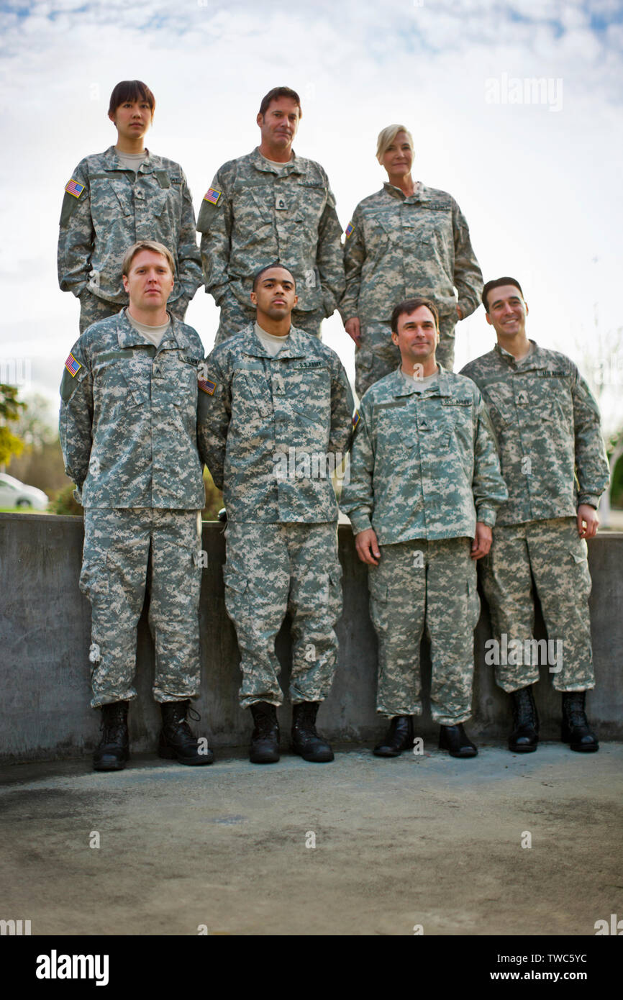

In [ ]:
# Uncomment for different target images
# target_path = "/content/drive/MyDrive/many_people.jpg"
# target_path = "/content/drive/MyDrive/people.jpg"
target_path = "/content/drive/MyDrive/army.jpg"
# target_path = "/content/drive/MyDrive/obama.jpg"


target_img = Image.open(target_path)
x, y = target_img.size
multiplier = 2
target_img= target_img.resize((int(x*multiplier), int(y*multiplier)))
target_img.show()

In [ ]:
image = create(source_path, target_path)

List of target paths:  []


100%|██████████| 1/1 [00:00<00:00, 17.04it/s]
1it [00:00, 316.17it/s]
1it [00:00, 1116.69it/s]
100%|██████████| 1/1 [00:00<00:00, 1830.77it/s]


List of target paths:  []


100%|██████████| 1/1 [00:00<00:00, 41.94it/s]
1it [00:00, 206.97it/s]
1it [00:00, 430.85it/s]
100%|██████████| 1/1 [00:00<00:00, 1657.83it/s]


List of target paths:  []


100%|██████████| 1/1 [00:00<00:00, 14.42it/s]
1it [00:00, 225.73it/s]
1it [00:00, 874.91it/s]
100%|██████████| 1/1 [00:00<00:00, 2138.86it/s]


List of target paths:  []


100%|██████████| 1/1 [00:00<00:00, 12.12it/s]
1it [00:00, 223.78it/s]
1it [00:00, 986.20it/s]
100%|██████████| 1/1 [00:00<00:00, 8240.28it/s]


List of target paths:  []


100%|██████████| 1/1 [00:00<00:00, 16.65it/s]
1it [00:00, 217.51it/s]
1it [00:00, 866.77it/s]
100%|██████████| 1/1 [00:00<00:00, 6355.01it/s]


List of target paths:  []


100%|██████████| 1/1 [00:00<00:00, 42.89it/s]
1it [00:00, 233.80it/s]
1it [00:00, 379.75it/s]
100%|██████████| 1/1 [00:00<00:00, 7943.76it/s]


List of target paths:  []


100%|██████████| 1/1 [00:00<00:00, 18.41it/s]
1it [00:00, 254.83it/s]
1it [00:00, 2368.33it/s]
100%|██████████| 1/1 [00:00<00:00, 6482.70it/s]


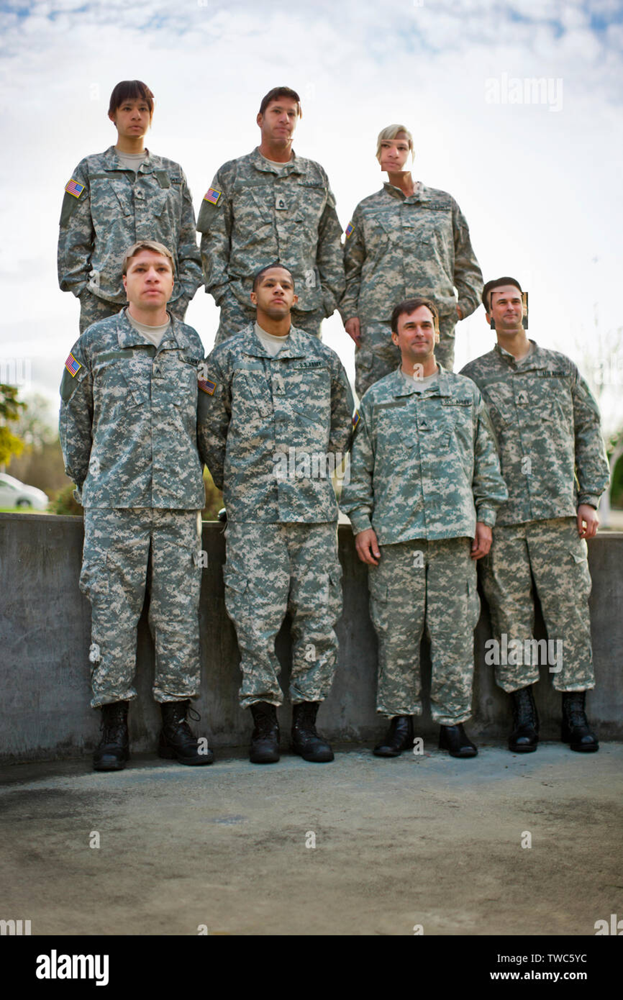

In [ ]:
final_image = Image.fromarray(image)
x, y = final_image.size
multiplier = 2
final_image = final_image.resize((int(x*multiplier), int(y*multiplier)))
final_image.show()